# Class-Conditional Synthesis with Latent Diffusion Models

Install all the requirements

In [ ]:
#This is from the github, I just had to solve some dependency issues/old verisoning
#should be good to run in colab

In [1]:
#@title Installation
!git clone https://github.com/CompVis/latent-diffusion.git
!git clone https://github.com/CompVis/taming-transformers
!pip install -e ./taming-transformers
!pip install omegaconf>=2.0.0 pytorch-lightning>=1.0.8 torch-fidelity einops

import sys, types, collections.abc as cabc
import numpy as np

m = types.ModuleType("torch._six")
m.string_classes = (str,)
m.int_classes = (int,)
m.container_abcs = cabc          # old code expects e.g. container_abcs.Iterable
sys.modules["torch._six"] = m


if not hasattr(np, "bool"):   # np.bool was removed; map it to np.bool_
    np.bool = np.bool_
if not hasattr(np, "int"):    # sometimes needed by other deps
    np.int = int
if not hasattr(np, "float"):
    np.float = float



import sys
sys.path.append(".")
sys.path.append('./taming-transformers')
from taming.models import vqgan

Cloning into 'latent-diffusion'...
remote: Enumerating objects: 341, done.
remote: Total 341 (delta 0), reused 0 (delta 0), pack-reused 341 (from 1)
Receiving objects: 100% (341/341), 28.69 MiB | 17.68 MiB/s, done.
Resolving deltas: 100% (143/143), done.
Cloning into 'taming-transformers'...
remote: Enumerating objects: 1342, done.
remote: Counting objects: 100% (1/1), done.
remote: Total 1342 (delta 0), reused 0 (delta 0), pack-reused 1341 (from 2)
Receiving objects: 100% (1342/1342), 409.77 MiB | 26.57 MiB/s, done.
Resolving deltas: 100% (282/282), done.
Obtaining file:///content/taming-transformers
  Preparing metadata (setup.py) ... done
  Running setup.py develop for taming-transformers


Now, download the checkpoint (~1.7 GB). This will usually take 1-2 minutes.

In [2]:
#@title Download
%cd latent-diffusion/

!mkdir -p models/ldm/cin256-v2/
!wget -O models/ldm/cin256-v2/model.ckpt https://ommer-lab.com/files/latent-diffusion/nitro/cin/model.ckpt

/content/latent-diffusion
--2025-10-17 17:03:22--  https://ommer-lab.com/files/latent-diffusion/nitro/cin/model.ckpt
Resolving ommer-lab.com (ommer-lab.com)... 141.84.41.65
Connecting to ommer-lab.com (ommer-lab.com)|141.84.41.65|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1827378153 (1.7G)
Saving to: ‘models/ldm/cin256-v2/model.ckpt’

models/ldm/cin256-v 100%[===================>]   1.70G  21.6MB/s    in 84s     

2025-10-17 17:04:47 (20.8 MB/s) - ‘models/ldm/cin256-v2/model.ckpt’ saved [1827378153/1827378153]



Let's also check what type of GPU we've got.

In [ ]:
!nvidia-smi

Mon Oct  6 21:56:15 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   37C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

Load it.

In [3]:
#@title loading utils
import torch
from omegaconf import OmegaConf

from ldm.util import instantiate_from_config


def load_model_from_config(config, ckpt):
    print(f"Loading model from {ckpt}")
    pl_sd = torch.load(ckpt)#, map_location="cpu")
    sd = pl_sd["state_dict"]
    model = instantiate_from_config(config.model)
    m, u = model.load_state_dict(sd, strict=False)
    model.cuda()
    model.eval()
    return model


def get_model():
    config = OmegaConf.load("configs/latent-diffusion/cin256-v2.yaml")
    model = load_model_from_config(config, "models/ldm/cin256-v2/model.ckpt")
    return model

In [4]:
#fix - install clip manually

!pip install git+https://github.com/openai/CLIP.git


  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-935qbwfx
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-935qbwfx
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.8 MB/s eta 0:00:00
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369490 sha256=308f732069a0caaec4eab9e1c12c7512a117912050b31ad6981e5fb979ede24c
  Stored in directory: /tmp/pip-ephem-wheel-cache-o966vgor/wheels/35/3e/df/3d24cbfb3b6a06f17a2bfd7d1138900d4365d9028aa8f6e92f
Successfully built clip


In [5]:
#more missing imports
!pip install kornia einops omegaconf ftfy regex

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 22.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 95.6 MB/s eta 0:00:00


In [6]:
#force downgraded libraries

import sys, types
try:
    # Prefer the modern location if installed
    from lightning_utilities.core.rank_zero import rank_zero_only
except Exception:
    # Minimal no-op fallback if lightning_utilities isn't installed
    def rank_zero_only(fn):
        def wrapped(*args, **kwargs):
            return fn(*args, **kwargs)
        return wrapped

# Create the deprecated module path so old imports succeed
pl_utils = types.ModuleType("pytorch_lightning.utilities.distributed")
pl_utils.rank_zero_only = rank_zero_only
sys.modules["pytorch_lightning.utilities.distributed"] = pl_utils



from ldm.models.diffusion.ddim import DDIMSampler

model = get_model()
sampler = DDIMSampler(model)

Loading model from models/ldm/cin256-v2/model.ckpt
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 400.92 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 3, 64, 64) = 12288 dimensions.
making attention of type 'vanilla' with 512 in_channels


And go. Quality, sampling speed and diversity are best controlled via the `scale`, `ddim_steps` and `ddim_eta` variables. As a rule of thumb, higher values of `scale` produce better samples at the cost of a reduced output diversity. Furthermore, increasing `ddim_steps` generally also gives higher quality samples, but returns are diminishing for values > 250. Fast sampling (i e. low values of `ddim_steps`) while retaining good quality can be achieved by using `ddim_eta = 0.0`.

rendering 6 examples of class '25' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (6, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:11<00:00,  1.78it/s]


rendering 6 examples of class '187' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (6, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:10<00:00,  1.96it/s]


rendering 6 examples of class '448' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (6, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:10<00:00,  1.91it/s]


rendering 6 examples of class '992' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (6, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:10<00:00,  1.91it/s]


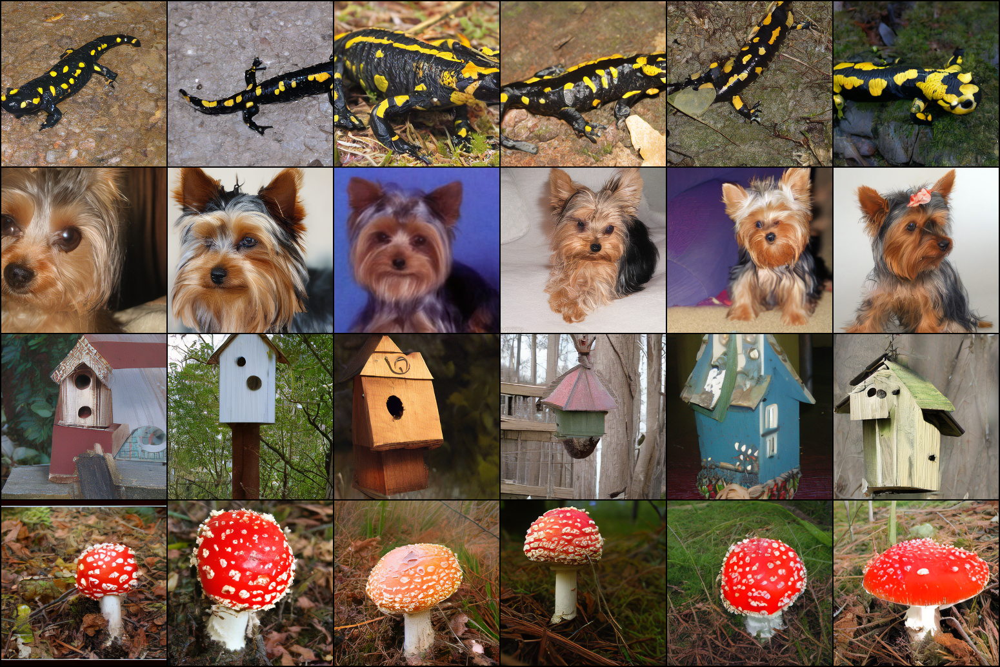

In [ ]:
import numpy as np
from PIL import Image
from einops import rearrange
from torchvision.utils import make_grid


classes = [25, 187, 448, 992]   # define classes to be sampled here
n_samples_per_class = 6

ddim_steps = 20
ddim_eta = 0.0
scale = 3.0   # for unconditional guidance


all_samples = list()

with torch.no_grad():
    with model.ema_scope():
        uc = model.get_learned_conditioning(
            {model.cond_stage_key: torch.tensor(n_samples_per_class*[1000]).to(model.device)}
            )

        for class_label in classes:
            print(f"rendering {n_samples_per_class} examples of class '{class_label}' in {ddim_steps} steps and using s={scale:.2f}.")
            xc = torch.tensor(n_samples_per_class*[class_label])
            c = model.get_learned_conditioning({model.cond_stage_key: xc.to(model.device)})

            samples_ddim, _ = sampler.sample(S=ddim_steps,
                                             conditioning=c,
                                             batch_size=n_samples_per_class,
                                             shape=[3, 64, 64],
                                             verbose=False,
                                             unconditional_guidance_scale=scale,
                                             unconditional_conditioning=uc,
                                             eta=ddim_eta)

            x_samples_ddim = model.decode_first_stage(samples_ddim)
            x_samples_ddim = torch.clamp((x_samples_ddim+1.0)/2.0,
                                         min=0.0, max=1.0)
            all_samples.append(x_samples_ddim)


# display as grid
grid = torch.stack(all_samples, 0)
grid = rearrange(grid, 'n b c h w -> (n b) c h w')
grid = make_grid(grid, nrow=n_samples_per_class)

# to image
grid = 255. * rearrange(grid, 'c h w -> h w c').cpu().numpy()
Image.fromarray(grid.astype(np.uint8))

In [ ]:
WNID_TO_LDMID = {'n02123045':281,'n02504458':386,'n01641577':31,'n01443537':1,'n01629819':41,'n01742172':56,'n01855672':99,'n01910747':107,'n01944390':113}

rendering 6 examples of class '281' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (6, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:12<00:00,  1.58it/s]


rendering 6 examples of class '386' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (6, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:12<00:00,  1.54it/s]


rendering 6 examples of class '31' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (6, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:12<00:00,  1.63it/s]


rendering 6 examples of class '1' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (6, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:11<00:00,  1.68it/s]


rendering 6 examples of class '41' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (6, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:11<00:00,  1.70it/s]


rendering 6 examples of class '56' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (6, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:11<00:00,  1.68it/s]


rendering 6 examples of class '99' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (6, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:12<00:00,  1.63it/s]


rendering 6 examples of class '107' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (6, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:12<00:00,  1.61it/s]


rendering 6 examples of class '113' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (6, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:12<00:00,  1.63it/s]


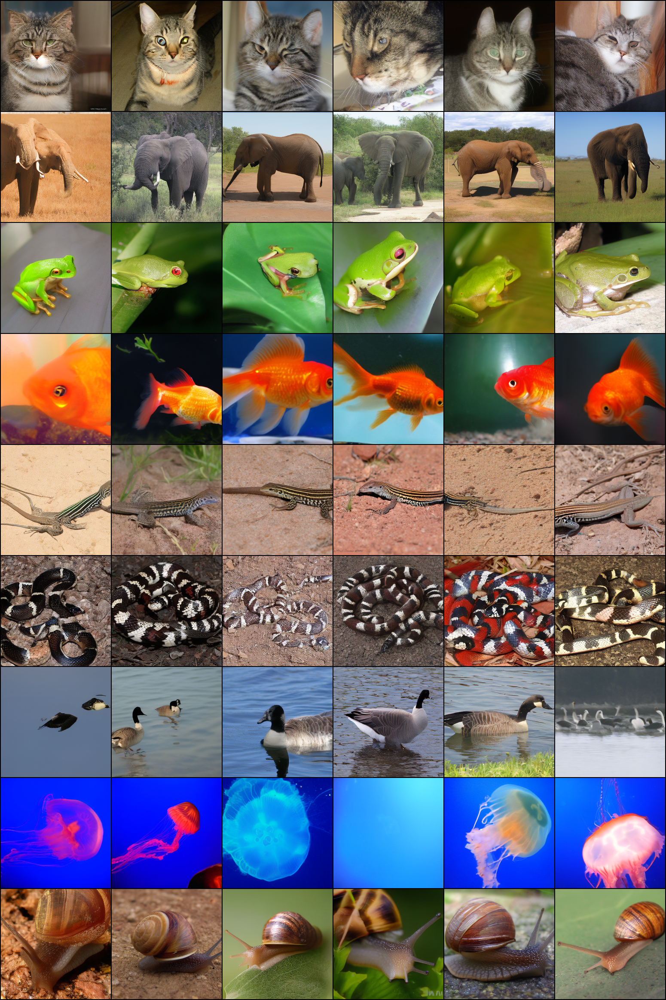

In [8]:
import numpy as np
from PIL import Image
from einops import rearrange
from torchvision.utils import make_grid


classes = [281, 386, 31, 1, 41, 56, 99, 107, 113]  #same as classes of imagenet
n_samples_per_class = 6

ddim_steps = 20
ddim_eta = 0.0
scale = 3.0   # for unconditional guidance


all_samples = list()

with torch.no_grad():
    with model.ema_scope():
        uc = model.get_learned_conditioning(
            {model.cond_stage_key: torch.tensor(n_samples_per_class*[1000]).to(model.device)}
            )

        for class_label in classes:
            print(f"rendering {n_samples_per_class} examples of class '{class_label}' in {ddim_steps} steps and using s={scale:.2f}.")
            xc = torch.tensor(n_samples_per_class*[class_label])
            c = model.get_learned_conditioning({model.cond_stage_key: xc.to(model.device)})

            samples_ddim, _ = sampler.sample(S=ddim_steps,
                                             conditioning=c,
                                             batch_size=n_samples_per_class,
                                             shape=[3, 64, 64],
                                             verbose=False,
                                             unconditional_guidance_scale=scale,
                                             unconditional_conditioning=uc,
                                             eta=ddim_eta)

            x_samples_ddim = model.decode_first_stage(samples_ddim)
            x_samples_ddim = torch.clamp((x_samples_ddim+1.0)/2.0,
                                         min=0.0, max=1.0)
            all_samples.append(x_samples_ddim)


# display as grid
grid = torch.stack(all_samples, 0)
grid = rearrange(grid, 'n b c h w -> (n b) c h w')
grid = make_grid(grid, nrow=n_samples_per_class)

# to image
grid = 255. * rearrange(grid, 'c h w -> h w c').cpu().numpy()
Image.fromarray(grid.astype(np.uint8))

Dataloader

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls /content/drive/MyDrive/18794-Diffusion-Project/tiny-imagenet-200/train
#/content/drive/MyDrive/18794-Diffusion-Project/tiny-imagenet-200/train


n01443537  n02113799  n02509815  n02988304  n03670208  n04146614  n04596742
n01629819  n02123045  n02666196  n02999410  n03706229  n04149813  n04597913
n01641577  n02123394  n02669723  n03014705  n03733131  n04179913  n06596364
n01644900  n02124075  n02699494  n03026506  n03763968  n04251144  n07579787
n01698640  n02125311  n02730930  n03042490  n03770439  n04254777  n07583066
n01742172  n02129165  n02769748  n03085013  n03796401  n04259630  n07614500
n01768244  n02132136  n02788148  n03089624  n03804744  n04265275  n07615774
n01770393  n02165456  n02791270  n03100240  n03814639  n04275548  n07695742
n01774384  n02190166  n02793495  n03126707  n03837869  n04285008  n07711569
n01774750  n02206856  n02795169  n03160309  n03838899  n04311004  n07715103
n01784675  n02226429  n02802426  n03179701  n03854065  n04328186  n07720875
n01855672  n02231487  n02808440  n03201208  n03891332  n04356056  n07734744
n01882714  n02233338  n02814533  n03250847  n03902125  n04366367  n07747607
n01910747  n

In [17]:
import os

base_path = "/content/drive/MyDrive/18794-Diffusion-Project/tiny-imagenet-200"
print("Base path exists:", os.path.exists(base_path))
print("Train path exists:", os.path.exists(os.path.join(base_path, "train")))
!ls -d /content/drive/MyDrive/18794-Diffusion-Project/tiny-imagenet-200/train/* | head

Base path exists: True
Train path exists: True
/content/drive/MyDrive/18794-Diffusion-Project/tiny-imagenet-200/train/n01443537
/content/drive/MyDrive/18794-Diffusion-Project/tiny-imagenet-200/train/n01629819
/content/drive/MyDrive/18794-Diffusion-Project/tiny-imagenet-200/train/n01641577
/content/drive/MyDrive/18794-Diffusion-Project/tiny-imagenet-200/train/n01644900
/content/drive/MyDrive/18794-Diffusion-Project/tiny-imagenet-200/train/n01698640
/content/drive/MyDrive/18794-Diffusion-Project/tiny-imagenet-200/train/n01742172
/content/drive/MyDrive/18794-Diffusion-Project/tiny-imagenet-200/train/n01768244
/content/drive/MyDrive/18794-Diffusion-Project/tiny-imagenet-200/train/n01770393
/content/drive/MyDrive/18794-Diffusion-Project/tiny-imagenet-200/train/n01774384
/content/drive/MyDrive/18794-Diffusion-Project/tiny-imagenet-200/train/n01774750


In [19]:
import os, glob
from collections import Counter
from PIL import Image

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

DATASET_DIR = "/content/drive/MyDrive/18794-Diffusion-Project/tiny-imagenet-200"
TRAIN_ROOT = os.path.join(DATASET_DIR, "train")

SELECTED_CLASSES = [
    'n02123045',  # cat
    'n02504458',  # elephant
    'n01641577',  # frog
    'n01443537', #fish
    'n01629819', #lizard
    'n01742172', #snake
    'n01855672', #goose
    'n01910747', #jellyfish
    'n01944390', #snail


]

# Native tiny-ImageNet size
train_transform = transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
])

EXTS = ["jpg", "jpeg", "png", "bmp", "tif", "tiff", "webp", "ppm"]

def collect_paths_for_class(train_root, wnid):
    """
    Return a list of image paths for a given wnid.
    Handles both: train/<wnid>/*.JPEG  and train/<wnid>/images/*.JPEG
    """
    paths = []
    for ext in EXTS + [e.upper() for e in EXTS]:
        paths.extend(glob.glob(os.path.join(train_root, wnid, f"*.{ext}")))

    for ext in EXTS + [e.upper() for e in EXTS]:
        paths.extend(glob.glob(os.path.join(train_root, wnid, "images", f"*.{ext}")))
    return sorted(paths)

class TinyImageNetSubset(Dataset):
    def __init__(self, train_root, selected_classes, transform=None):
        if not os.path.isdir(train_root):
            raise FileNotFoundError(f"train_root not found: {train_root}")

        self.transform = transform
        self.selected = [wnid for wnid in selected_classes if os.path.isdir(os.path.join(train_root, wnid))]
        self.missing = [wnid for wnid in selected_classes if wnid not in self.selected]

        #match id to imageNet
        self.class_to_new = {wnid: i for i, wnid in enumerate(selected_classes) if wnid in self.selected}
        self.new_to_class = {v: k for k, v in self.class_to_new.items()}
        self.samples = []
        for wnid in self.selected:
            files = collect_paths_for_class(train_root, wnid)
            if not files:
                print(f"[warn] No images found for {wnid} under {train_root}/{wnid} or {train_root}/{wnid}/images")
            for p in files:
                self.samples.append((p, self.class_to_new[wnid]))

        if len(self.samples) == 0:
            raise FileNotFoundError(
                "No images found for the selected classes. "
                "Check folder names, structure, or permissions."
            )

        #debug
        counts = Counter([t for _, t in self.samples])
        print("\n--- Subset summary ---")
        if self.missing:
            print("Missing classes:", self.missing)
        else:
            print("Missing classes: (none)")
        for new_id in sorted(counts):
            print(f"{new_id:2d} -> {self.new_to_class[new_id]}: {counts[new_id]} images")
        print(f"TOTAL images in subset: {len(self.samples)}\n")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, target = self.samples[idx]
        img = Image.open(path).convert("RGB")
        if self.transform is not None:
            img = self.transform(img)
        return img, target


subset = TinyImageNetSubset(TRAIN_ROOT, SELECTED_CLASSES, transform=train_transform)
loader = DataLoader(subset, batch_size=32, shuffle=True, num_workers=2, pin_memory=True)

#debug
imgs, labels = next(iter(loader))
print("Batch:", imgs.shape, labels.shape)



--- Subset summary ---
Missing classes: (none)
 0 -> n02123045: 500 images
 1 -> n02504458: 500 images
 2 -> n01641577: 500 images
 3 -> n01443537: 500 images
 4 -> n01629819: 500 images
 5 -> n01742172: 500 images
 6 -> n01855672: 500 images
 7 -> n01910747: 500 images
 8 -> n01944390: 500 images
TOTAL images in subset: 4500

Batch: torch.Size([32, 3, 64, 64]) torch.Size([32])


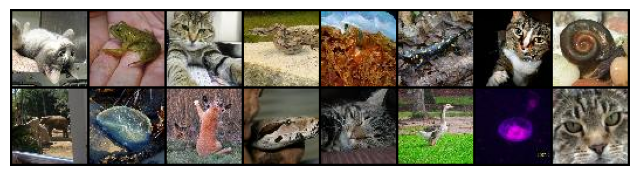

In [20]:
import matplotlib.pyplot as plt
import torchvision

grid = torchvision.utils.make_grid(imgs[:16], nrow=8)
plt.figure(figsize=(8,4))
plt.axis("off")
plt.imshow(grid.permute(1,2,0).cpu().numpy())
plt.show()



Measure FID

In [2]:
!pip -q install torch-fidelity

In [21]:
import os, shutil
from torchvision.utils import save_image
import torch


REAL_DIR = "/content/fid_eval/real"
if os.path.exists(REAL_DIR):
    shutil.rmtree(REAL_DIR)
os.makedirs(REAL_DIR, exist_ok=True)

N_REAL = 5000

saved = 0
idx = 0
#save real images
with torch.no_grad():
    for imgs, labels in loader:
        for i in range(imgs.size(0)):
            if saved >= N_REAL:
                break
            # imgs are already 64×64 tensors in [0,1]
            out_path = os.path.join(REAL_DIR, f"{idx:07d}.png")
            save_image(imgs[i], out_path)   # writes 0–1 tensor as PNG uint8
            saved += 1
            idx += 1
        if saved >= N_REAL:
            break

print(f"Exported {saved} real images to {REAL_DIR}")


Exported 4500 real images to /content/fid_eval/real


In [ ]:

SELECTED_WNIDS = [
    'n02123045',  # cat
    'n02504458',  # elephant
    'n01641577' ,  # frog
    'n01443537', #fish
    'n01629819', #lizard
    'n01742172', #snake
    'n01855672', #goose
    'n01910747', #jellyfish
    'n01944390'#snail
]



WNID_TO_LDMID = {
   'n02123045' : 281,  # cat
    'n02504458': 386,  # elephant
    'n01641577' : 31,  # frog
    'n01443537' :1, #fish
    'n01629819' :41, #lizard
    'n01742172':56, #snake
    'n01855672':99, #goose
    'n01910747':107, #jellyfish
    'n01944390':113#snail
}

# IO locations
REAL_DIR = "/content/fid_eval/real_by_class"
FAKE_DIR = "/content/fid_eval/fake_by_class"
os.makedirs(FAKE_DIR, exist_ok=True)

# Sampling knobs
TOTAL_PER_CLASS = 625        # 8 * 625 = 5000 total
SIZE = [3, 64, 64]
DDIM_STEPS, ETA, CFG = 20, 0.0, 2.0
BATCH, MICROBATCH = 32, 8    # reduce if VRAM is tight


print("cond_stage_key:", getattr(model, "cond_stage_key", None))
print("conditioning_key:", getattr(model, "conditioning_key", None))
print("UNet dtype:", next(model.model.diffusion_model.parameters()).dtype)
print("VAE dtype:",  next(model.first_stage_model.parameters()).dtype)
print("Device:", model.device)
print("CFG:", CFG, "(remember: effective batch ~2x with CFG > 1 due to concatenation)")
print("Selected WNIDs:", SELECTED_WNIDS)

# Sanity checks
missing_map = [w for w in SELECTED_WNIDS if w not in WNID_TO_LDMID]
if missing_map:
    raise ValueError(f"WNIDs missing from WNID_TO_LDMID: {missing_map}")


In [ ]:
from torch_fidelity import calculate_metrics
import torch

metrics = calculate_metrics(
    input1="/content/fid_eval/real",
    input2="/content/fid_eval/fake",
    fid=True,
    kid=True,
    isc=True,
    #modify to work with small dataset
    kid_subset_size=min(48, 1000),
    kid_subset_count=20,
    verbose=True,
    cuda=torch.cuda.is_available(),
    batch_size=32
)
print(metrics)


Creating feature extractor "inception-v3-compat" with features ['logits_unbiased', '2048']
Extracting features from input1
Looking for samples non-recursivelty in "/content/fid_eval/real" with extensions png,jpg,jpeg
Found 4500 samples
Processing samples
Extracting features from input2
Looking for samples non-recursivelty in "/content/fid_eval/fake" with extensions png,jpg,jpeg
Found 5000 samples
Processing samples
Inception Score: 10.936101646434016 ± 0.24342105656288116
Frechet Inception Distance: 152.85745794803933
                                                                                 

{'inception_score_mean': 10.936101646434016, 'inception_score_std': 0.24342105656288116, 'frechet_inception_distance': 152.85745794803933, 'kernel_inception_distance_mean': 0.11110708236694336, 'kernel_inception_distance_std': 0.00790457489986221}


Kernel Inception Distance: 0.11110708236694336 ± 0.00790457489986221
